### Using the Image class
The most important class in the Python Imaging Library is the Image class, defined in the module with the same name. You can create instances of this class in several ways; either by loading images from files, processing other images, or creating images from scratch.

To load an image from a file, use the open() function in the Image module:

In [196]:
from PIL import Image

image = Image.open('khan.jpg')

If successful, this function returns an Image object. You can now use instance attributes to examine the file contents:

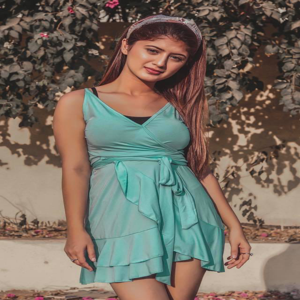

In [197]:
image.resize((300,300))

In [4]:
from __future__ import print_function
print(image.format)
print(image.size)
print(image.mode)

JPEG
(640, 960)
RGB


The format attribute identifies the source of an image. If the image was not read from a file, it is set to None. The size attribute is a 2-tuple containing width and height (in pixels). The mode attribute defines the number and names of the bands in the image, and also the pixel type and depth. Common modes are “L” (luminance) for greyscale images, “RGB” for true color images, and “CMYK” for pre-press images.

If the file cannot be opened, an IOError exception is raised.

Once you have an instance of the Image class, you can use the methods defined by this class to process and manipulate the image. For example, let’s display the image we just loaded:

In [6]:
image.show()

### Note:
The standard version of show() is not very efficient, since it saves the image to a temporary file and calls the xv utility to display the image. If you don’t have xv installed, it won’t even work. When it does work though, it is very handy for debugging and tests.

#### The following sections provide an overview of the different functions provided in this library.

### Reading and writing images
The Python Imaging Library supports a wide variety of image file formats. To read files from disk, use the open() function in the Image module. You don’t have to know the file format to open a file. The library automatically determines the format based on the contents of the file.

To save a file, use the save() method of the Image class. When saving files, the name becomes important. Unless you specify the format, the library uses the filename extension to discover which file storage format to use.

Convert files to JPEG

In [7]:
from PIL import Image
image = Image.open('khan.jpg')

In [8]:
image.save('khan1.png')

A second argument can be supplied to the save() method which explicitly specifies a file format. If you use a non-standard extension, you must always specify the format this way:

In [9]:
from PIL import Image
image = Image.open('khan.jpg')

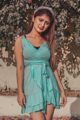

In [17]:
size = (120,120)
image.thumbnail(size=size) # we can resize image with thumbnail
image

In [15]:
image.save('khan2','png')

It is important to note that the library doesn’t decode or load the raster data unless it really has to. When you open a file, the file header is read to determine the file format and extract things like mode, size, and other properties required to decode the file, but the rest of the file is not processed until later.

This means that opening an image file is a fast operation, which is independent of the file size and compression type. Here’s a simple script to quickly identify a set of image files:

In [20]:
from PIL import Image

try:
    with Image.open('khan2') as im:
        print('khan2', im.format, im.mode, im.size)
except IOError as e:
    print(e)

khan2 PNG RGB (80, 120)


In [21]:
from PIL import Image

try:
    with Image.open('han2') as im:
        print('khan2', im.format, im.mode, im.size)
except IOError as e:
    print(e)

[Errno 2] No such file or directory: 'han2'


### Cutting, pasting, and merging images
The Image class contains methods allowing you to manipulate regions within an image. To extract a sub-rectangle from an image, use the crop() method.

Copying a subrectangle from an image

In [60]:
from PIL import Image
im = Image.open('khan.jpg')
box = (200,40,450,300)
region = im.crop(box)

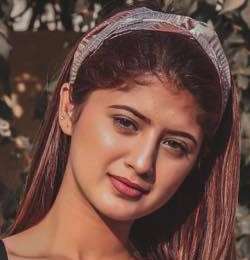

In [61]:
region

The region is defined by a 4-tuple, where coordinates are (left, upper, right, lower). The Python Imaging Library uses a coordinate system with (0, 0) in the upper left corner. Also note that coordinates refer to positions between the pixels, so the region in the above example is exactly 300x300 pixels.

The region could now be processed in a certain manner and pasted back.

Processing a subrectangle, and pasting it back

In [62]:
region = region.transpose(Image.ROTATE_180)
im.paste(region, box)

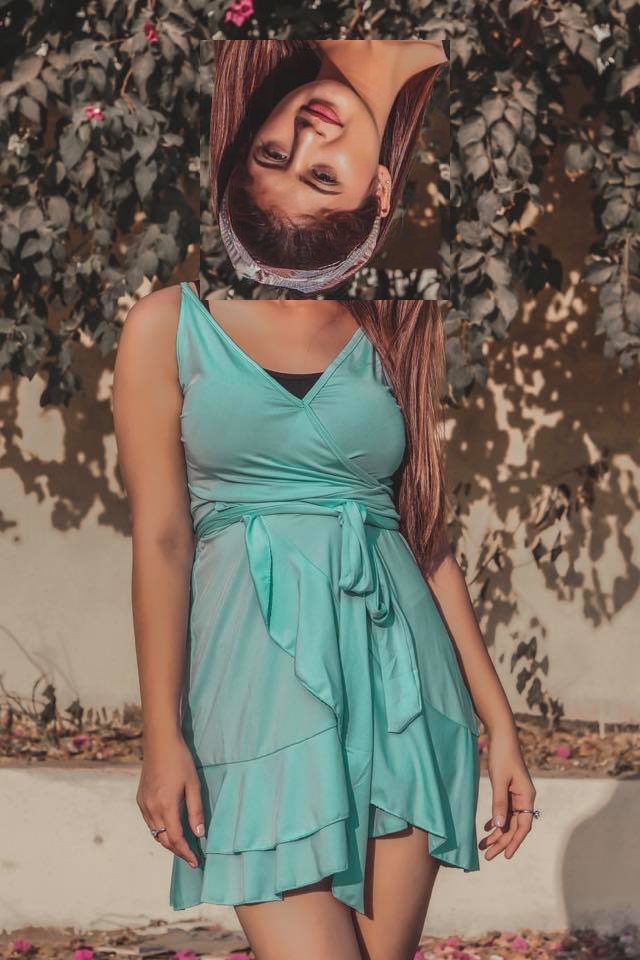

In [63]:
im

When pasting regions back, the size of the region must match the given region exactly. In addition, the region cannot extend outside the image. However, the modes of the original image and the region do not need to match. If they don’t, the region is automatically converted before being pasted (see the section on Color transforms below for details).

Rolling an Image

In [64]:
def roll(image, delta):
    "Roll an image sideways"

    xsize, ysize = image.size

    delta = delta % xsize
    if delta == 0: return image

    part1 = image.crop((0, 0, delta, ysize))
    part2 = image.crop((delta, 0, xsize, ysize))
    image.paste(part2, (0, 0, xsize-delta, ysize))
    image.paste(part1, (xsize-delta, 0, xsize, ysize))

    return image

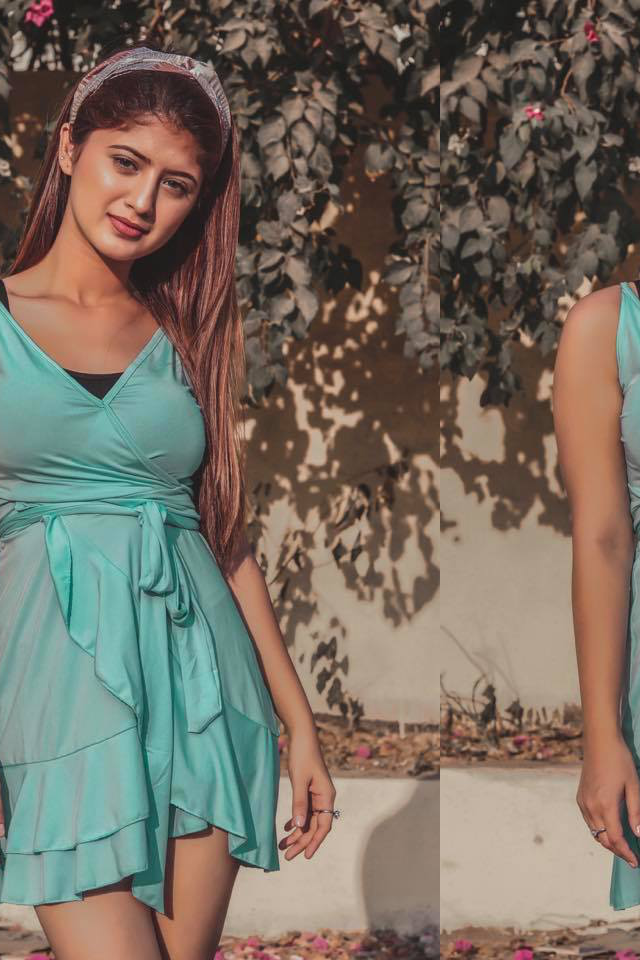

In [74]:
from PIL import Image
img = Image.open('khan.jpg')
img1 = roll(img,200)
img1

For more advanced tricks, the paste method can also take a transparency mask as an optional argument. In this mask, the value 255 indicates that the pasted image is opaque in that position (that is, the pasted image should be used as is). The value 0 means that the pasted image is completely transparent. Values in-between indicate different levels of transparency. For example, pasting an RGBA image and also using it as the mask would paste the opaque portion of the image but not its transparent background.

The Python Imaging Library also allows you to work with the individual bands of an multi-band image, such as an RGB image. The split method creates a set of new images, each containing one band from the original multi-band image. The merge function takes a mode and a tuple of images, and combines them into a new image. The following sample swaps the three bands of an RGB image:

Splitting and merging bands

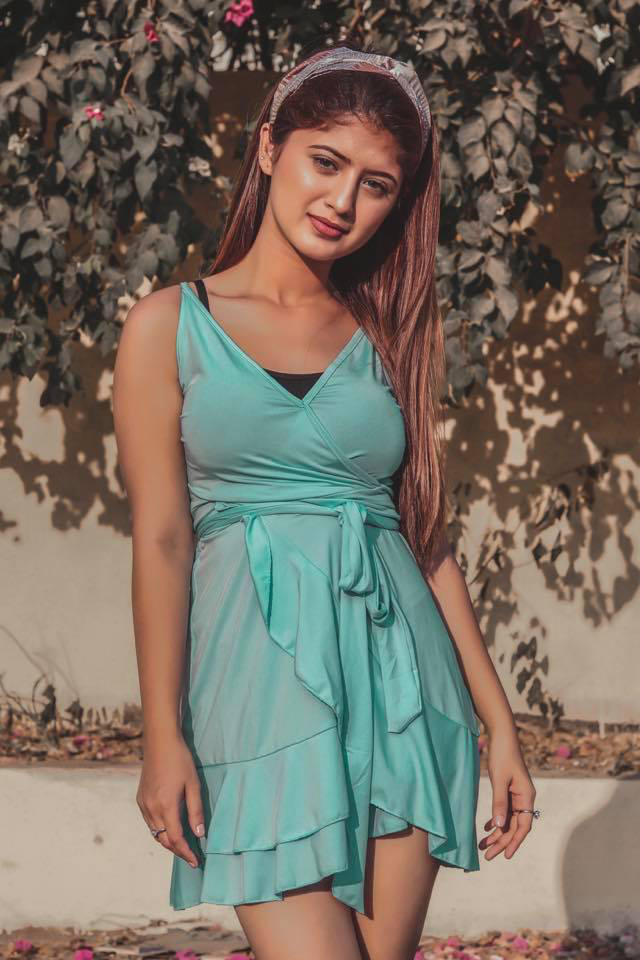

In [78]:
from PIL import Image
im = Image.open('khan.jpg')
im

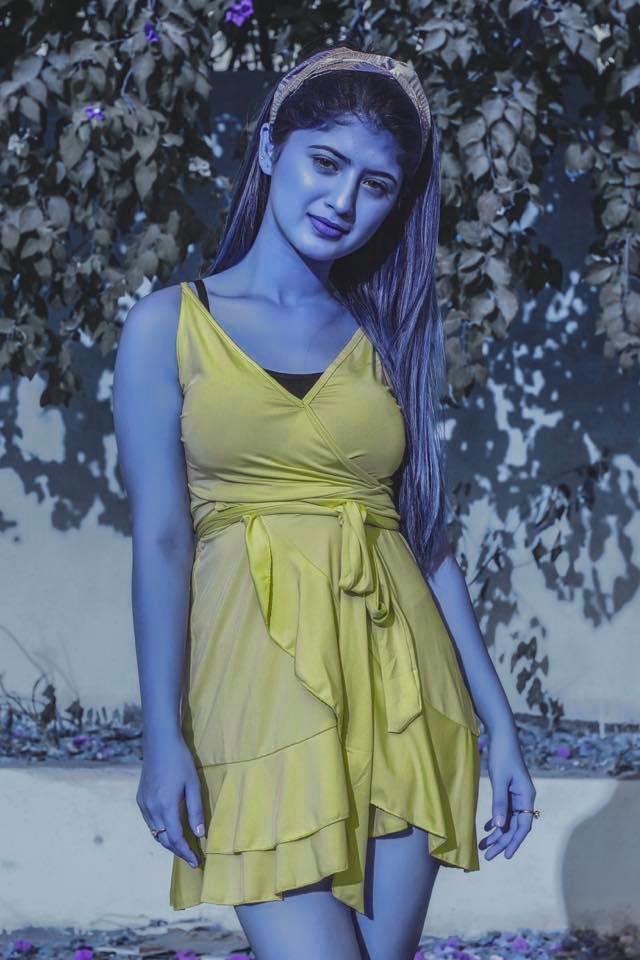

In [77]:
r,g,b = im.split()
im = Image.merge('RGB', (b,g,r))
im

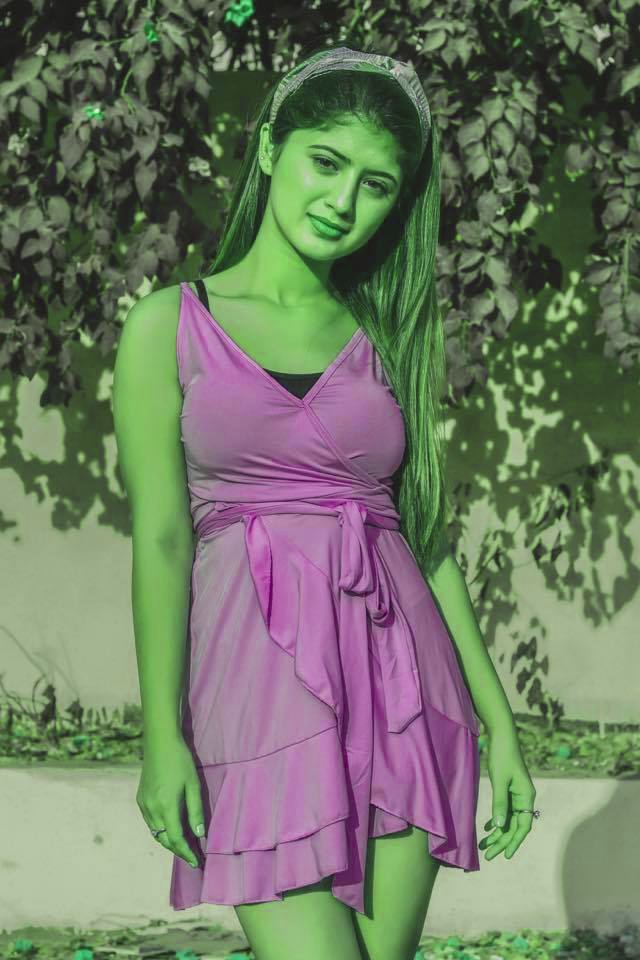

In [79]:
im = Image.merge('RGB', (g,r,b))
im

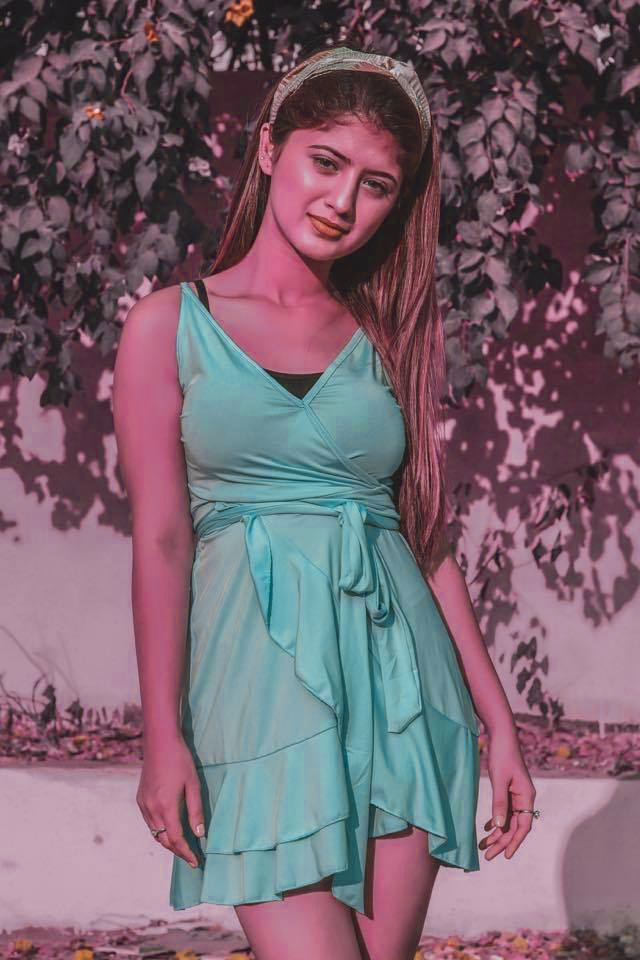

In [81]:
im = Image.merge('RGB', (r,b,g))
im

Note that for a single-band image, split() returns the image itself. To work with individual color bands, you may want to convert the image to “RGB” first.

### Geometrical transforms
The PIL.Image.Image class contains methods to resize() and rotate() an image. The former takes a tuple giving the new size, the latter the angle in degrees counter-clockwise.

### Simple geometry transforms

In [98]:
from PIL import Image
im = Image.open('khan.jpg')

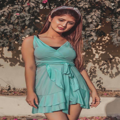

In [99]:
i = im.resize((120,120))
i

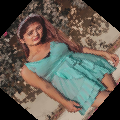

In [102]:
i1 = i.rotate(50)
i1

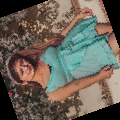

In [103]:
i1 = i.rotate(110)
i1

To rotate the image in 90 degree steps, you can either use the rotate() method or the transpose() method. The latter can also be used to flip an image around its horizontal or vertical axis.

Transposing an image

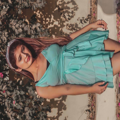

In [105]:
i2 = i.transpose(Image.ROTATE_90)
i2

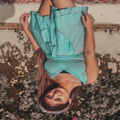

In [106]:
i2 = i.transpose(Image.ROTATE_180)
i2

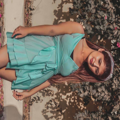

In [107]:
i2 = i.transpose(Image.ROTATE_270)
i2

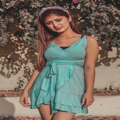

In [108]:
i2 = i.transpose(Image.FLIP_LEFT_RIGHT)
i2

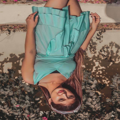

In [109]:
i2 = i.transpose(Image.FLIP_TOP_BOTTOM)
i2

There’s no difference in performance or result between transpose(ROTATE) and corresponding rotate() operations.

A more general form of image transformations can be carried out via the transform() method.

### Color transforms
The Python Imaging Library allows you to convert images between different pixel representations using the convert() method.

#### Converting between modes

In [115]:
from PIL import Image
im = Image.open('khan.jpg')

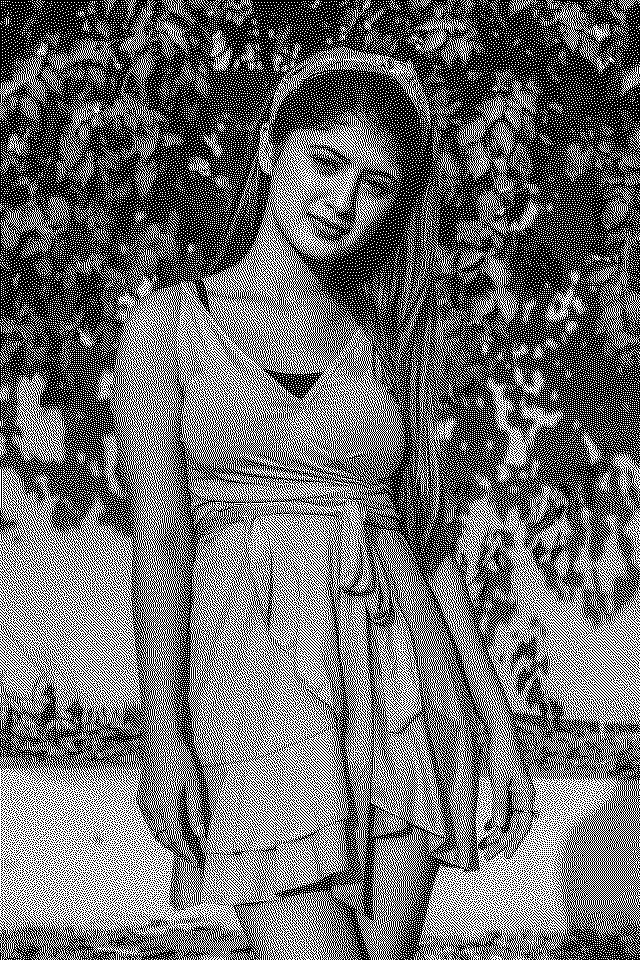

In [119]:
im.convert('1')

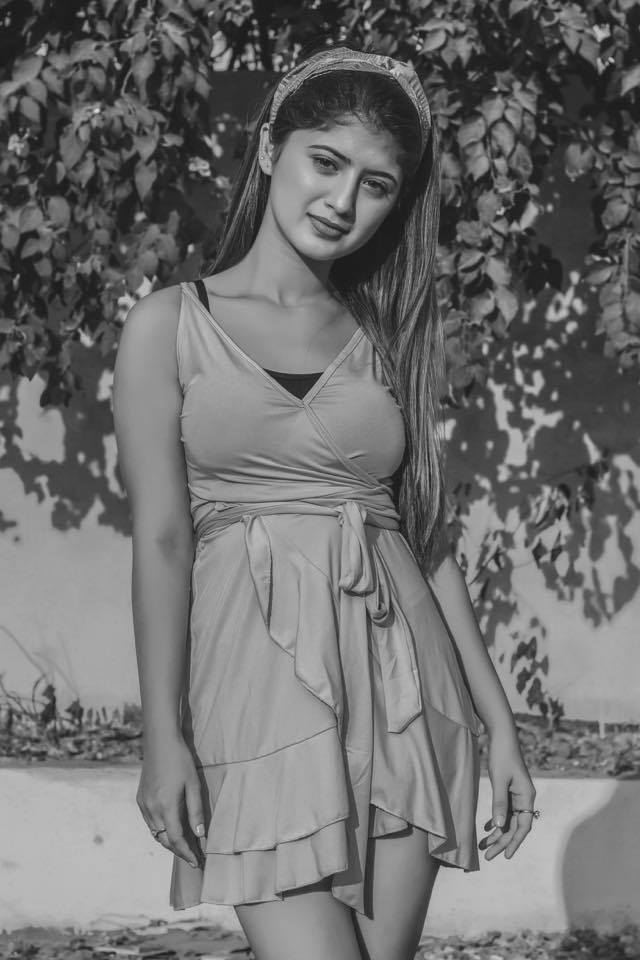

In [120]:
im.convert('L')

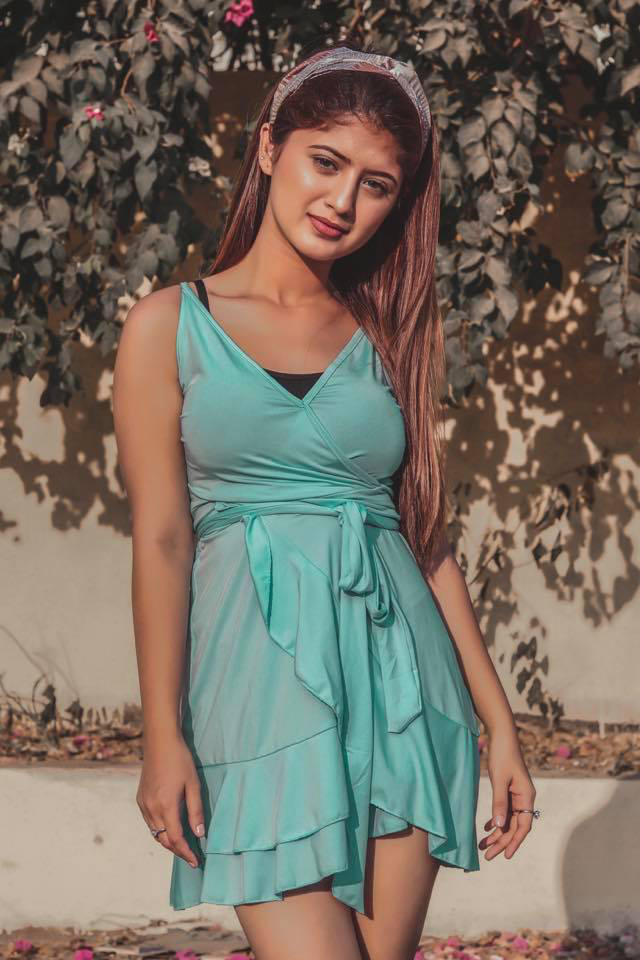

In [121]:
im.convert("RGB")

The library supports transformations between each supported mode and the “L” and “RGB” modes. To convert between other modes, you may have to use an intermediate image (typically an “RGB” image).

### Image enhancement
The Python Imaging Library provides a number of methods and modules that can be used to enhance images.

### Filters
The ImageFilter module contains a number of pre-defined enhancement filters that can be used with the filter() method.

Applying filters

In [126]:
from PIL import Image, ImageFilter
im = Image.open('khan.jpg')

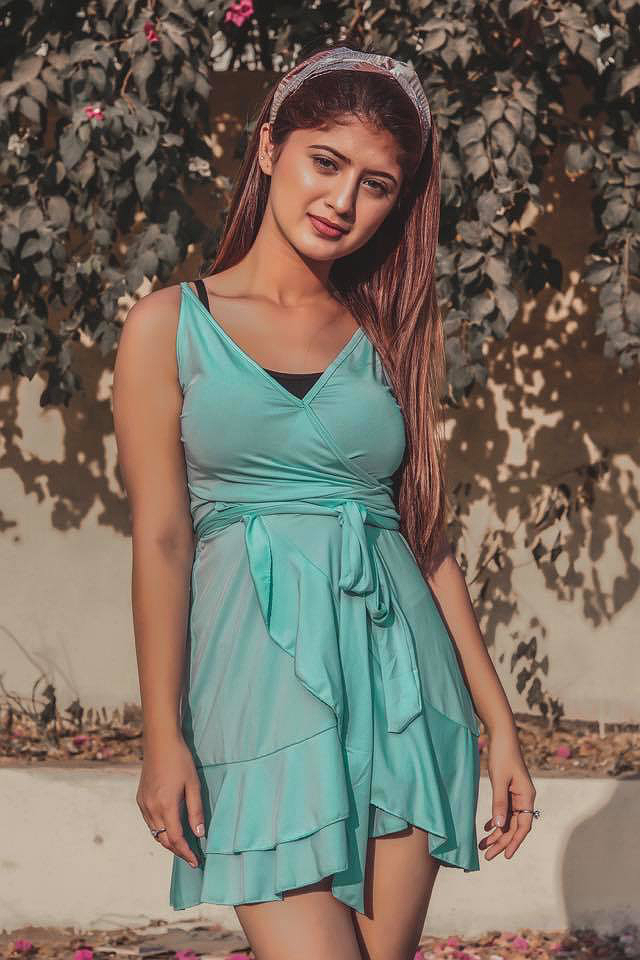

In [127]:
out = im.filter(ImageFilter.DETAIL)
out

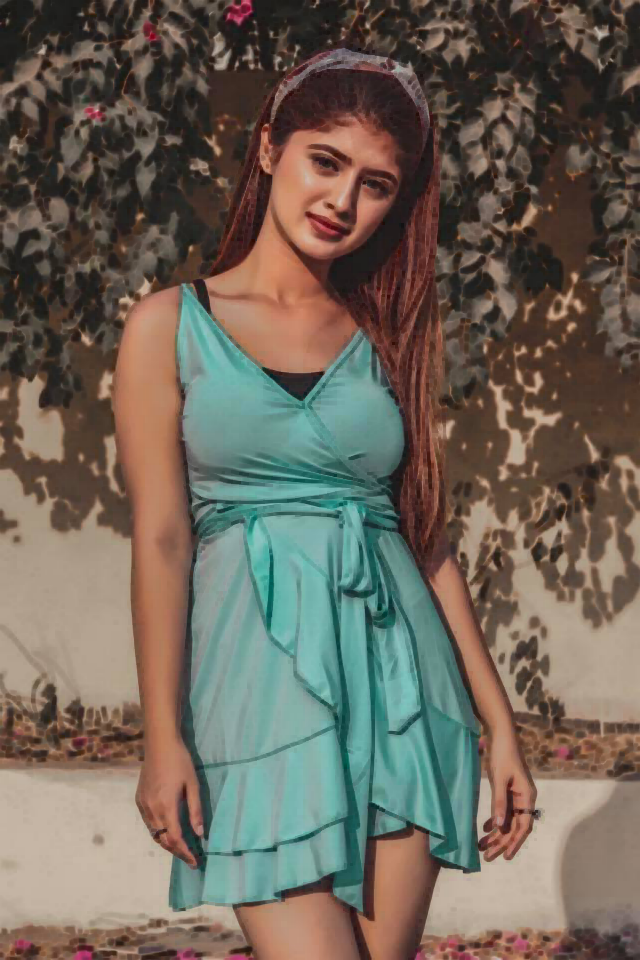

In [128]:
out = im.filter(ImageFilter.MinFilter)
out

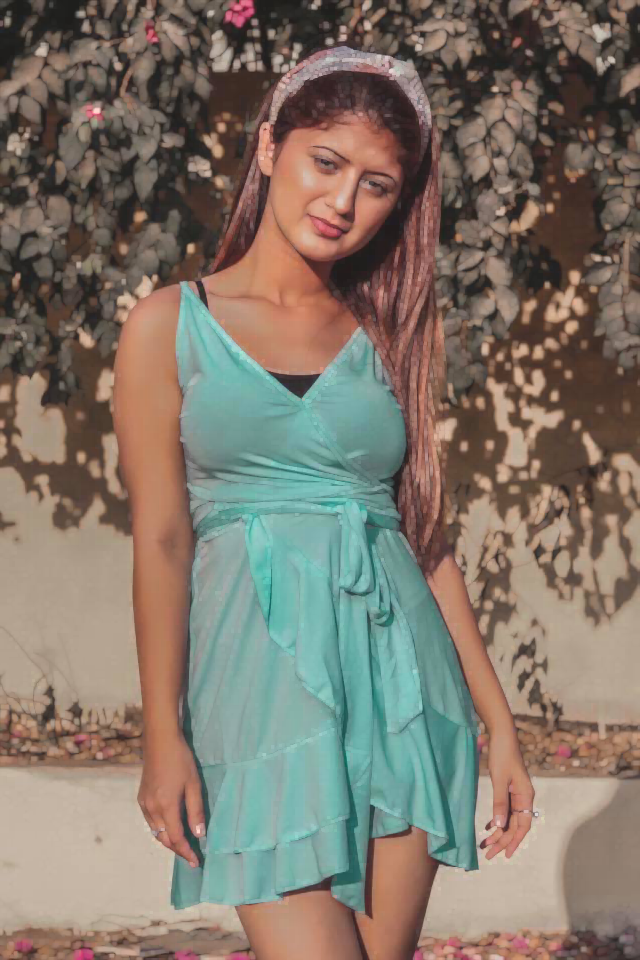

In [129]:
out = im.filter(ImageFilter.MaxFilter)
out

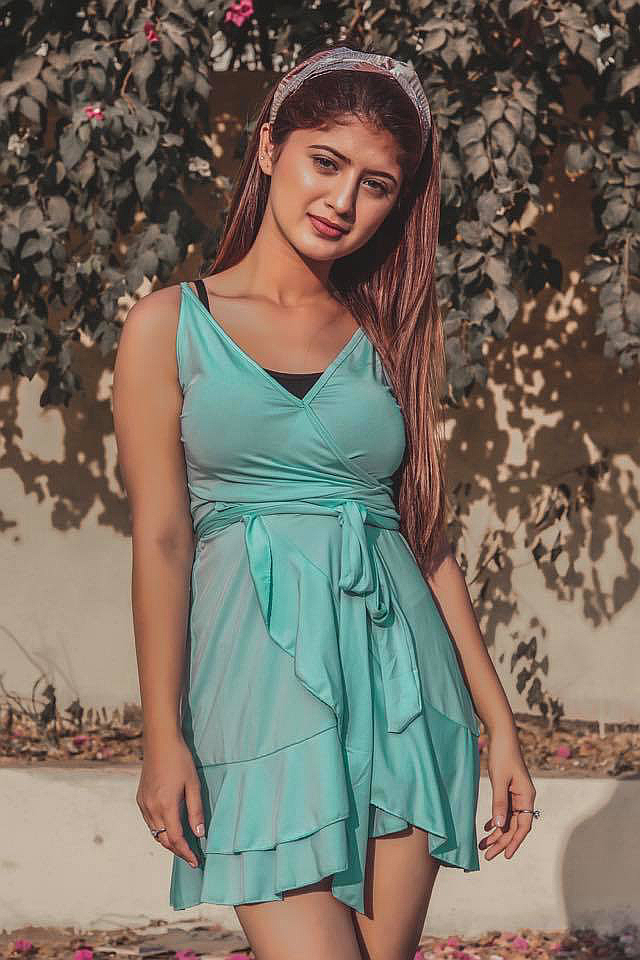

In [130]:
out = im.filter(ImageFilter.SHARPEN)
out

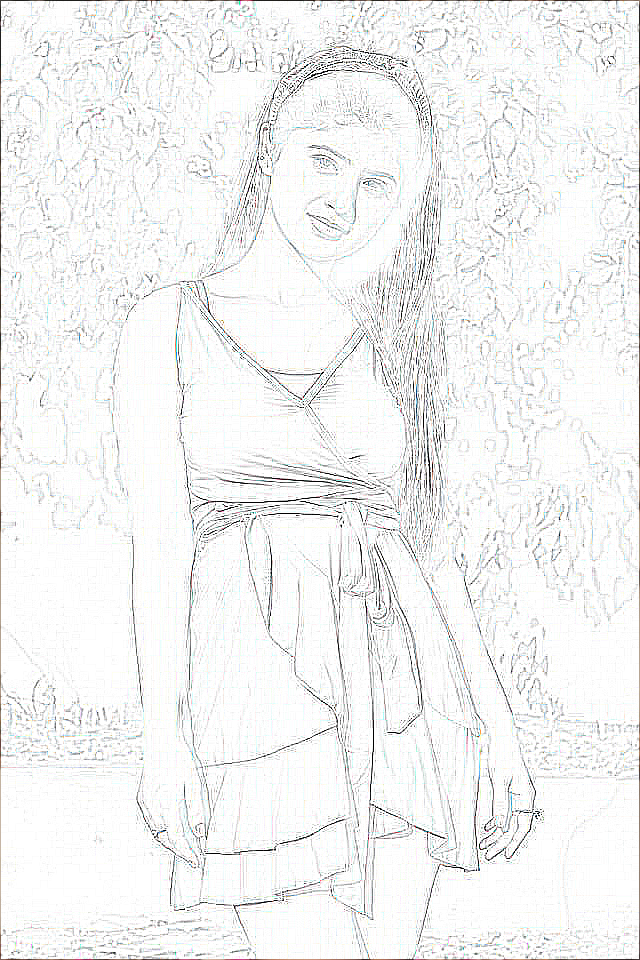

In [135]:
out = im.filter(ImageFilter.CONTOUR)
out

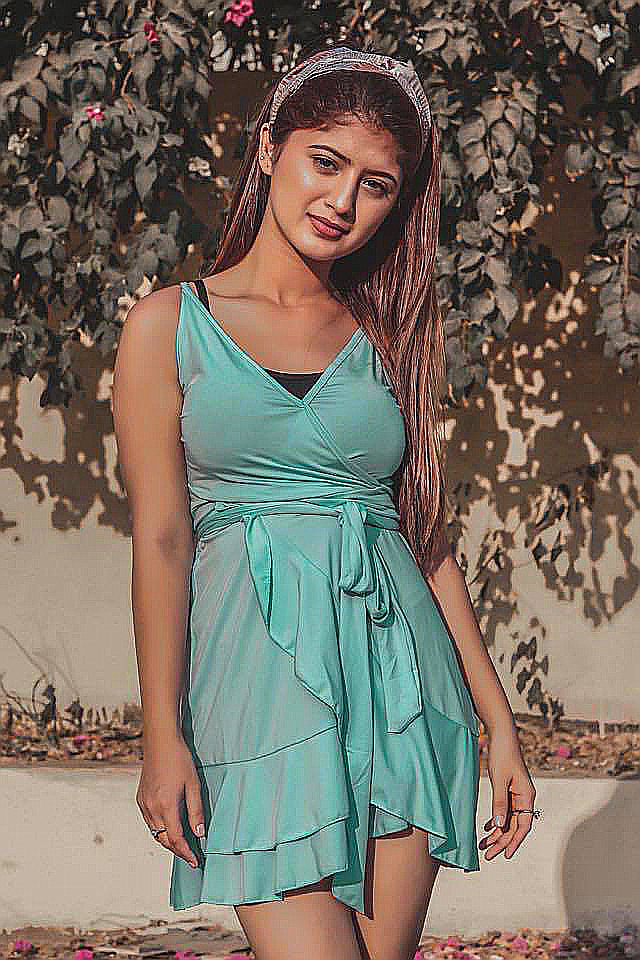

In [136]:
out = im.filter(ImageFilter.EDGE_ENHANCE)
out

### Point Operations
The point() method can be used to translate the pixel values of an image (e.g. image contrast manipulation). In most cases, a function object expecting one argument can be passed to this method. Each pixel is processed according to that function:

Applying point transforms

In [137]:
from PIL import Image
im = Image.open('khan.jpg')


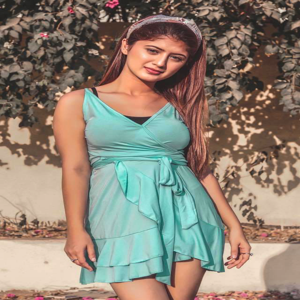

In [151]:
out = im.point(lambda i: i*1.2)
out.resize((300,300))

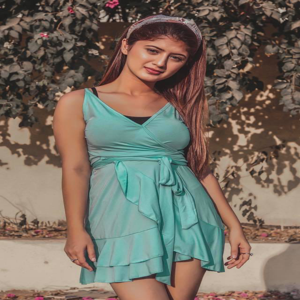

In [142]:
im.resize((300,300))

Using the above technique, you can quickly apply any simple expression to an image. You can also combine the point() and paste() methods to selectively modify an image:

### Processing individual bands

In [155]:
from PIL import Image
im = Image.open('khan.jpg')

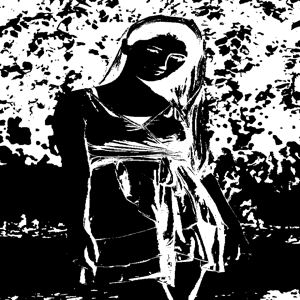

In [166]:
# split the image into individual bands
source = im.split()

R, G, B = 0, 1, 2

# select regions where red is less than 100
mask = source[R].point(lambda i: i < 100 and 255)
mask.resize((300,300))

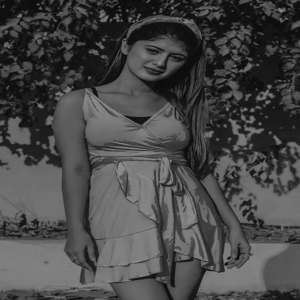

In [165]:

# process the green band
out = source[G].point(lambda i: i * 0.7)
out.resize((300,300))

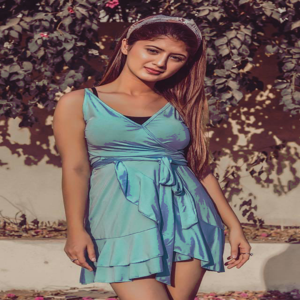

In [164]:
#paste the processed band back, but only where red was < 100
source[G].paste(out, None, mask)

# build a new multiband image
im = Image.merge(im.mode, source)
im.resize((300,300))

### Enhancement
For more advanced image enhancement, you can use the classes in the ImageEnhance module. Once created from an image, an enhancement object can be used to quickly try out different settings.

You can adjust contrast, brightness, color balance and sharpness in this way.

Enhancing images

In [167]:
from PIL import Image, ImageEnhance
im = Image.open('khan.jpg').resize((300,300))

In [169]:
ehn = ImageEnhance.Contrast(im)

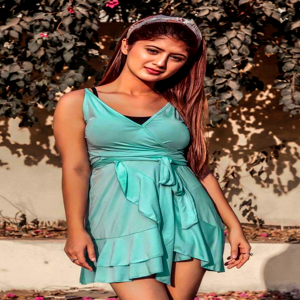

In [173]:
ehn.enhance(1.5)

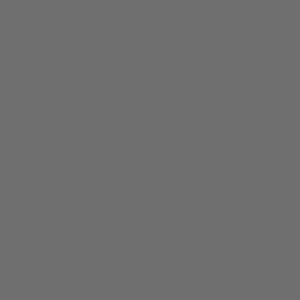

In [179]:
ehn.degenerate

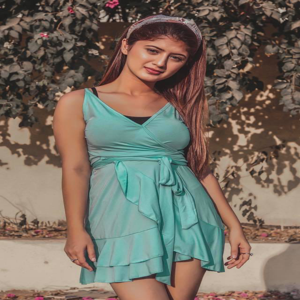

In [180]:
ehn.image

In [181]:
ehn1 = ImageEnhance.Brightness(im)

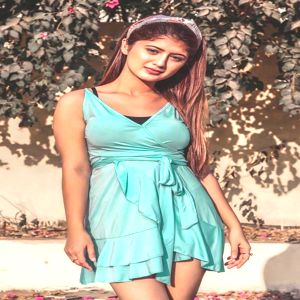

In [184]:
ehn1.enhance(1.5)

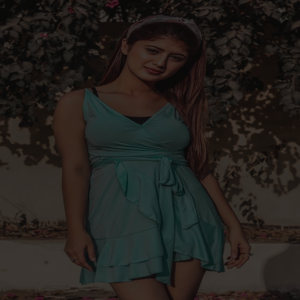

In [185]:
ehn1.enhance(0.3)

In [186]:
ehn2 = ImageEnhance.Sharpness(im)

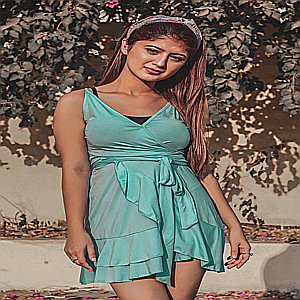

In [190]:
ehn2.enhance(5.9)

### More on reading images
As described earlier, the open() function of the Image module is used to open an image file. In most cases, you simply pass it the filename as an argument:

In [191]:
from PIL import Image
im = Image.open('khan.jpg')

If everything goes well, the result is an PIL.Image.Image object. Otherwise, an IOError exception is raised.

You can use a file-like object instead of the filename. The object must implement read(), seek() and tell() methods, and be opened in binary mode.

Reading from an open file


In [193]:
fp = open('khan.jpg', 'rb')
im = Image.open(fp)

To read an image from string data, use the StringIO class:

Reading from a string

In [194]:
import StringIO

im = Image.open(StringIO.StringIO(buffer))

ModuleNotFoundError: No module named 'StringIO'

Note that the library rewinds the file (using seek(0)) before reading the image header. In addition, seek will also be used when the image data is read (by the load method). If the image file is embedded in a larger file, such as a tar file, you can use the ContainerIO or TarIO modules to access it.

Reading from a tar archive

In [198]:
from PIL import TarIO

fp = TarIO.TarIO("Imaging.tar", "Imaging/test/lena.ppm")
im = Image.open(fp)

FileNotFoundError: [Errno 2] No such file or directory: 'Imaging.tar'